# Esopianeti
Un esopianeta, o pianeta extrasolare, è un pianeta che orbita attorno a una stella diversa dal nostro Sole, e quindi ovviamente al di fuori del sistema solare. La scoperta degli esopianeti è un fatto relativamente recente, che ha origine sul finire degli anni '80. A seguito di un inizio piuttosto lento, come vedremo, sono stati scoperti più di 4000 esopianeti, e alcuni dei quali presenterebbero addirittura caratteristiche potenzialmente compatibili con la vita.

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm
from matplotlib import ticker
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

df = pd.read_csv('Datasets/phl_exoplanet_catalog_2019_cleaned.csv')

habitable = df[df['P_HABITABLE'] != 0]
non_habitable = df[df['P_HABITABLE'] == 0]

# Cronologia delle scoperte
Le prime rivelazioni concernenti i pianeti extrasolari risalgono, come precedentemente affermato, alla fine degli anni '80, e più precisamente al 1989. Successivamente, il numero di esopianeti individuati è andato costantemente aumentando, per poi giungere a stabilizzarsi intorno ai **180 pianeti rilevati annualmente** (fino al 2019). Tuttavia, emergono chiaramente due anni che non sembrano seguire questa tendenza, e tali anni sono il 2014 e il 2016, ma questa discrepanza è solo apparente: il numero di individuazioni così elevato è attribuibile alla missione Kepler, varata nel 2009, i cui dati sono stati rilasciati solo dopo alcuni anni (il ritardo è dovuto, tra le altre cose, al fatto che le osservazioni sono prolungate e richiedono numerosi controlli per verificare la presenza di un esopianeta); le individuazioni apparentemente numerose nel 2014 e nel 2016 sono quindi, in effetti, la somma di diversi anni di scoperte accumulate e rilasciate in blocco. Possiamo comunque notare che, in generale, il numero complessivo di pianeti scoperti sembra seguire una **tendenza esponenziale**.

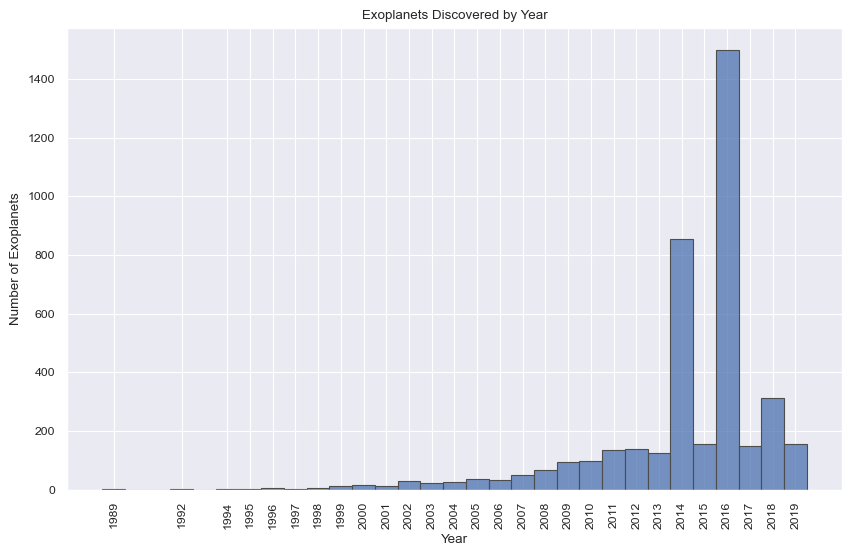

In [6]:
sns.set_theme(style='darkgrid', context='paper')
plt.figure(figsize=(10, 6))
sns.histplot(data=pd.DataFrame(df.groupby(['P_YEAR', 'P_TYPE'])['P_NAME'].count().reset_index()).sort_values(by=['P_YEAR', 'P_NAME']),
             x='P_YEAR',
             edgecolor=".3",
             discrete=True,
             weights='P_NAME')
plt.title('Exoplanets Discovered by Year')
plt.xlabel('Year')
plt.ylabel('Number of Exoplanets')

plt.xticks(rotation=90, ticks=df['P_YEAR'].unique())

plt.show()


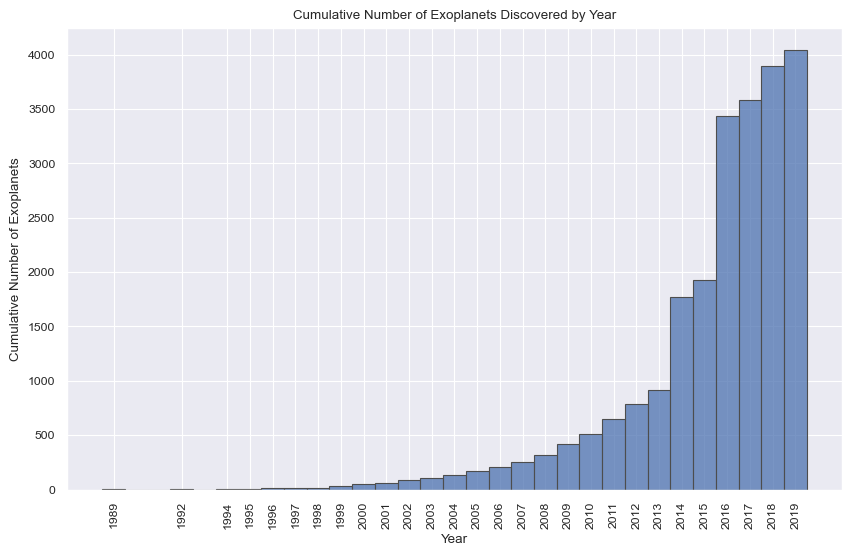

In [7]:
sns.set_theme(style='darkgrid', context='paper')
plt.figure(figsize=(10, 6))

graph=sns.histplot(data=pd.DataFrame(df.groupby(['P_YEAR'])['P_NAME'].count().cumsum().reset_index()).sort_values(by=['P_YEAR','P_NAME']),
                     x='P_YEAR',
                    edgecolor=".3",
                    discrete=True,
                    weights='P_NAME')
plt.title('Cumulative Number of Exoplanets Discovered by Year')
plt.xlabel('Year')
plt.ylabel('Cumulative Number of Exoplanets')
plt.xticks(rotation=90, ticks=df['P_YEAR'].unique())

plt.show()

# Tipologie di pianeti
Prima di addentrarci nell'analisi specifica delle scoperte degli esopianeti, bisogna fare una distinzione di cosa hanno scoperto i vari scienziati. Le varie scoperte vengono suddivisi per il raggio dell'esopianeta in confronto a quella della Terra (R⊕) e avremmo come classificazione come segue:
1. **Miniterran** (0 to 0.4 R⊕)
2. **Subterran** (0.4 to 0.8 R⊕)
3. **Terran** (0.8 to 1.6 R⊕)
4. **Superterran** (1.6 to 2.5 R⊕)
5. **Neptunian** (2.5 to 4.2 R⊕)
6. **Jovian** (>4.2 R⊕).

### Pianeta con R "piccolo"
Da qui possiamo già fare una prima scrematura dei pianeti che possiamo considerare per renderli propensi per ospitare la vita perchè il raggio del pianeta può darci già alcune stime sul fatto che quel pianete possa ospitare la vita. 
Per prima cosa bisogna dire che il raggio di un corpo è correlato alla sua capacità di avere un'atmosfera. Pianeti più piccoli possono avere difficoltà a mantenere un'atmosfera densa e stabile perchè il corpo non possedendo una gravità elevata, non è in grado di trattenerla. Ed è cruciale per sostenere la vita come la conosciamo perchè permette di regolare la temperatura. 
Altre analisi dirette sapendo solo la tipologia del pianeta è se possiede un campo magnetico. Il campo magnetico è determinato dal nucleo del pianeta, di conseguenza più è grande il corpo che stiamo considerando più è forte il suo campo magnetico. Serve per un pianeta perchè permette di schermare il pianeta da radiazioni provenienti dallo spazio e dalla sua stella madre. Un ultimo parametro che può essere determinato è se è presente o meno una attività tettonica. Se un corpo è piccolo, non è in grado di avere un nucleo caldo e di avere una crosta solida portandolo a non avviare tutti quei processi tettonici che influenzano il clima e la chimica della superficie.

Quindi pianeti della categoria Miniterran potrebbero avere difficoltà ad ospitare la vita a causa della quasi assenza della capacità di possedere un campo magnetico, facendo di conseguenza entrare troppe radiazioni nocive e non riuscendo a mantenere un atmosfera.

### Pianeta con R "grosso"
Al contrario se il pianeta è eccessivamente più grande della Terra, potrebbe non essere in grado di ospitarla. Perchè ci sarà un atmosfera con una pressione troppo eleveta e/o troppo densa, il che porterà il pianeta ad avere temperature troppo alte per la vita per come la conosciamo.
Successivamente il pianeta avrà una maggiore forza di gravità che può rendere difficile per gli esseri viventi muoversi e respirare.
Infine la superficie di un pianeta con un raggio elevato ha una alta probabilità di possedere una superficie troppo movimentata.

Più avanti analizzeremo meglio l'aspetto dell'abitabilità di un esopianeta.

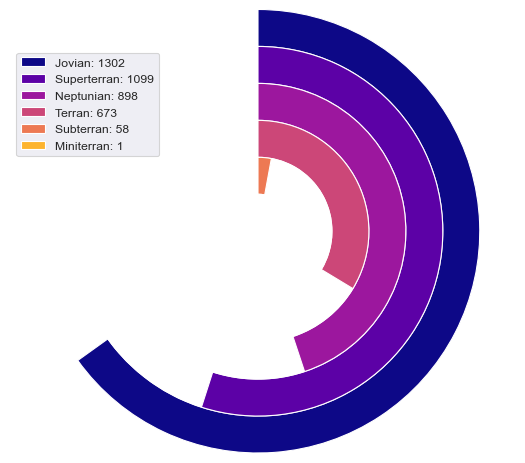

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from math import log10

df = pd.read_csv('Datasets/phl_exoplanet_catalog_2019_cleaned.csv')

planet_type_counts = df.groupby('P_TYPE').count()['P_NAME'].sort_values(ascending=False)

num_planet_types = len(planet_type_counts)

max_value = max(planet_type_counts)
scale_factor = 10 ** int(log10(max_value))
max_scale = scale_factor * (1 + max_value // scale_factor)

donut_radius = 1.5

ring_width = donut_radius / num_planet_types

colors = [cm.plasma(i / num_planet_types) for i in range(num_planet_types)]

fig, ax = plt.subplots()
ax.axis("equal")

for i in range(num_planet_types):
    inner_ring, _ = ax.pie([max_scale - planet_type_counts[i], planet_type_counts[i]],
                           radius=donut_radius - i * ring_width,
                           startangle=90,
                           labels=["", planet_type_counts.index[i] + ": " + str(planet_type_counts[i])],
                           labeldistance=1 - 1 / (1.5 * (num_planet_types - i)),
                           textprops={"alpha": 0}, 
                           colors=["white", colors[i]])
    plt.setp(inner_ring, width=ring_width, edgecolor="white")

plt.legend(loc='upper left')

plt.show()

Da questo grafico risulta evidente che la maggior parte degli esopianeti che abbiamo scoperto sono della tipologia Jovian. Per quello che abbiamo detto prima, è molto probabile che un pianeta di queste dimensioni non riesca a sviluppare vita o ad ospitarla.
Per quanto riguarda i Miniterran, non vengono mostrati sul grafico perchè nel dataset che abbiamo considerato, è stato scoperto solo 1 di questa tipologia di pianeta (venne ipotizzato che il pianeta fosse in realtà un artefatto causato dal vento emanato dalla Pulsar che stavano osservando gli scienziati, poi smentita).
Infatti gli unici pianeti che potrebbero ospitare la vita, all'interno del dataset cha abbiamo esaminato, sono tutti pianeti di dimensioni simili alla Terra. Quindi possiamo confermare quello detto in precedenza anche se, potrebbe trattarsi di una coincidenza.

# Tipologie di pianeti, temperatura ed Earth Similarity Index

Esaminiamo ora la suddivisione dei pianeti in diverse tipologie (gioviani, superterre, nettuniani, subterre, terrestri, miniterre) e cerchiamo eventuali correlazioni tra la loro temperatura e l'Earth Similarity Index (ESI). Osserviamo subito che, fatta eccezione per le miniterre (una categoria a cui appartiene un solo pianeta, quindi non presente nei grafici), solo i pianeti terrestri e le superterre possono mostrare un elevato indice di similarità con la Terra. In particolare, come ci si potrebbe attendere, solo i pianeti con una temperatura superficiale classificata come "warm" presentano un alto ESI, il quale diminuisce notevolmente se la temperatura diventa "hot" o "cold". Al contrario, non vi sono pianeti appartenenti alle altre categorie che manifestino un ESI particolarmente elevato.


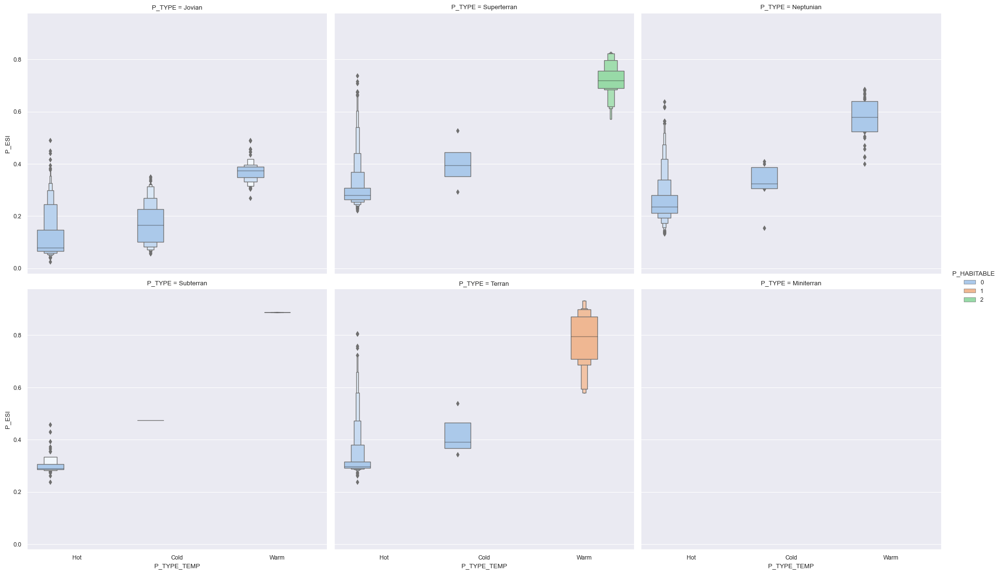

In [42]:
conservatively_habitable = df[df['P_HABITABLE'] == 1]
optimistically_habitable = df[df['P_HABITABLE'] == 2]
conservatively_habitable_oversampled = pd.concat([conservatively_habitable] * (len(non_habitable) - 3500), ignore_index=True)
optimistically_habitable_oversampled = pd.concat([optimistically_habitable] * (len(non_habitable) - 3500), ignore_index=True)
oversampled = pd.concat([non_habitable, conservatively_habitable_oversampled, optimistically_habitable_oversampled])

sns.catplot(x="P_TYPE_TEMP", y="P_ESI", hue="P_HABITABLE", col="P_TYPE", col_wrap=3, aspect=1.1, kind='boxen', data=oversampled, palette='pastel', height=6, linewidth=1)
plt.show()

# Telescopi spaziali e terrestri

Ora analizzeremo come sono stati scoperti i vari esopianeti. Un buon 75% dei pianeti che noi conosciamo sono stati scoperti da dei satelliti in orbita nello spazio. Ma esattamente quali satelliti hanno scoperto gli esopianenti che abbiamo esaminato, ma sopratutto quanti sono?

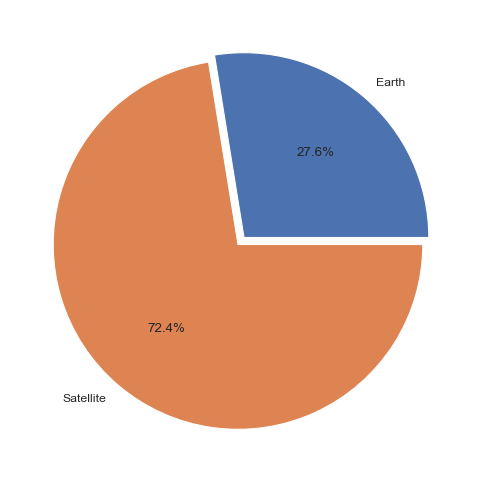

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from geopy.geocoders import Nominatim
import folium
import json 
with open('Datasets/custom.geo.json', 'r', encoding='utf-8') as f:
    geo_data = json.load(f)

df = pd.read_csv("Datasets/observatory_location.csv",delimiter=',')

df_locationSum=pd.DataFrame(df[df['Type']=='Earth'].groupby(['Location','State'])['Discover'].sum().reset_index())

df_stateFix=df[df['Type']=='Earth'].copy()
df_stateFix.loc[df['State'].isin(['Hawaii','California','Massachusetts','New Mexico','Arizona','Texas']), 'State'] = 'United States of America'
df_stateFix.loc[df['State']=='Tenerife', 'State'] = 'Spain'

plt.figure(figsize=(6, 6))
plt.pie(data=pd.DataFrame(df.groupby(['Type'])['Discover'].sum().reset_index()),x='Discover',labels='Type',autopct='%1.1f%%',explode=[0.025,0.025])
plt.show()

I satelliti che hanno scoperto circa 3100 pianti sono 7 tra cui figura anche Hubble. Come possiamo ben vedere, quasi tutti i pianeti che abbiamo scoperto derivano dalle scoperte dalla missione Kepler. K2 non è altro che il telescopio Kepler dopo aver concluso la missione originale ed ha finito il suo lavoro nel 2018 quando ha esaurito il carburante. Da solo, Kepler ha scoperto circa 2900 esopianeti tra il 2009 e il 2018. Dopo la missione Kepler è iniziata la missione TESS condotta dalla Nasa con un satellite simile a Kepler.

Ora che abbiamo esaminato i satelliti, esaminiamo quale nazione ha scoperto più esopianeti.

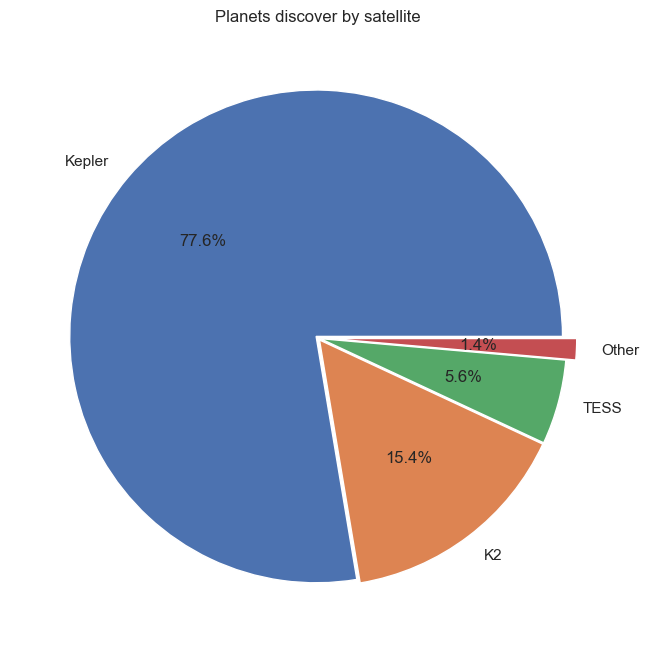

In [44]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(8, 8))
df_satellite=df[df['Type']=='Satellite'].copy()
df_satellite.loc[df['Name'].isin(['CoRoT',"CHaracterising ExOPlanets Satellite (CHEOPS)",'Spitzer Space Telescope','Hubble Space Telescope']), 'Name'] = 'Other'
df_satellite.loc[df['Name']=='Transiting Exoplanet Survey Satellite (TESS)', 'Name']='TESS'
plt.pie(data=pd.DataFrame(df_satellite.groupby(['Name'])['Discover'].sum().reset_index()).sort_values('Discover',ascending=False), x='Discover',labels='Name',autopct='%1.1f%%',explode=[0.01,0.01,0.01,0.05])

plt.title('Planets discover by satellite')
plt.show()

# Nazioni che hanno scoperto più esopianeti
Possiamo osservare che la maggior parte di scoperte degli esopianeti è stata effettuata in U.S.A oppure in Cile. Questo perchè in U.S.A e in Cile esistono dei luoghi ottimi per posizionare i telescopi. 
I fattori da considerare per decidere dove posizionare i vari telescopi sono:
### Condizioni atmosferiche
Il Cile e gli Stati Uniti sono due paesi con condizioni meteorologiche molto favorevoli per l'osservazione del cielo notturno. Il cielo è spesso limpido e privo di nuvole, il che consente di osservare le stelle e i pianeti con grande dettaglio.

In particolare, il Cile è considerato uno dei migliori posti al mondo per l'osservazione astronomica. Il deserto di Atacama, situato nel nord del Cile, è uno dei luoghi più aridi del mondo. La mancanza di umidità e di nuvole rende il cielo notturno molto limpido e favorisce l'osservazione di oggetti celesti con scarsa quantità di luce emessa.

### Gli investimenti
Possiamo considerarlo come un punto meno importante ma entrambi i paesi hanno investito molto nella ricerca astronomica che hanno permesso agli astronomi di questi paesi di sviluppare nuove tecnologie e tecniche di osservazione che hanno contribuito alla scoperta di numerosi pianeti extrasolari.

### Inquinamento luminoso
L'inquinamento luminoso è una delle principali minacce per l'astronomia. Consiste nella luce artificiale che disturba l'osservazione del cielo notturno. Può provenire da fonti come lampioni stradali, edifici, pubblicità e luci domestiche.

L'inquinamento luminoso può causare una serie di problemi per i telescopi, tra cui:

1. Riduce la visibilità degli oggetti celesti. La luce artificiale può sovrapporsi alla luce naturale delle stelle e dei pianeti, rendendoli più difficili da vedere.

2. Aumenta il rumore di fondo. La luce artificiale può creare una sorta di "rumore" nel cielo notturno, che può rendere difficile distinguere gli oggetti celesti deboli.

3. Rende più difficile la ricerca di pianeti extrasolari. I telescopi sono utilizzati per rilevare i pianeti extrasolari osservando il modo in cui la luce delle loro stelle madri viene attenuata quando i pianeti passano davanti a loro. L'inquinamento luminoso può rendere più difficile rilevare queste attenuazioni, rendendo più difficile la scoperta di nuovi pianeti extrasolari.
Non a caso, la stragrande maggioranza degli osservatori si trovano: nei deserti, in montagna o in cui non è presente luce. La mappa che segue permette di vedere questo tipo di informazione in maniera chiara.

In [45]:
#ATTENZIONE! Il sequente codice farà delle chiamate alla API di OpenStreetMap
geo = Nominatim(user_agent="observator_location")
location = {}
for key,value in df_locationSum.iterrows():
    location[key]=geo.geocode(value['Location']+" "+value['State'])

d=df.iloc[12]
geo.geocode(d['Location']+" "+d['State'])

m = folium.Map(location=[0, 0], zoom_start=2)

choropleth=folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=pd.DataFrame(df_stateFix.groupby(['State'])['Discover'].sum().reset_index()),
    columns=['State', 'Discover'],
    key_on='feature.properties.name_en',
    fill_color='YlOrRd',
    nan_fill_color='none',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of planets discovered',
).add_to(m)

m


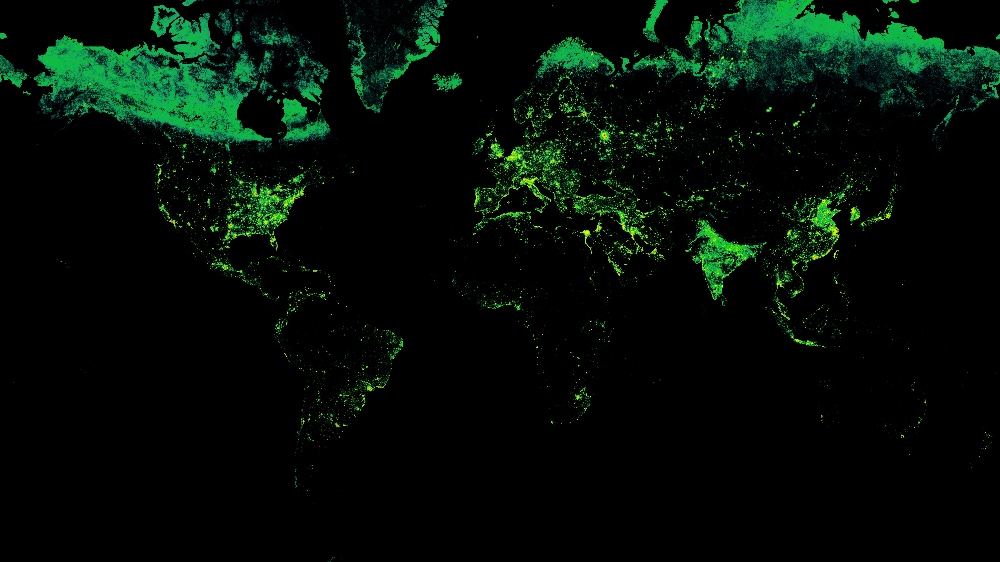

In [46]:
m = folium.Map(location=[0, 0], zoom_start=2, zoom_control=False, max_lat=75, min_lat=-62, max_bounds=True)
image_path = 'PNG/viirs_2022.png'
map_bounds = [[75.1, -180], [-65.2, 180]]

folium.raster_layers.ImageOverlay(
image=image_path,
bounds=map_bounds,
opacity=0.8,
interactive=True,
).add_to(m)


for key,value in location.items():
    if value != None:
        folium.CircleMarker([value.latitude, value.longitude],
        fill=True, 
        popup=location[key],
        radius=int(df_locationSum['Discover'][key])*0.05,
        fill_opacity=1,
        color='red',
        ).add_to(m)
m

(Cerchi più indicano che in quel determinato luogo sono stati scoperti un numero maggiore di pianeti dagli osservatori).

Possiamo vedere come la maggior parte degli osservatori sono in regioni con bassissima concentrazione di luci. Tuttavia ci sono alcuni osservatori che sono proprio in posti in cui l'inquinamento luminoso è elevato come in Europa o in Cina. Ci sono una serie di motivi per cui gli osservatori si trovano in questi posti, tra cui:
1. Storia e tradizione. L'astronomia è una disciplina antica con una lunga storia Europea e Cinese. Molti osservatori sono stati fondati secoli fa e hanno una grande tradizione di ricerca.
2. Accesso alla tecnologia. L'Europa e la Cina sono delle regioni leader nella ricerca astronomica. Molti osservatori hanno accesso alle ultime tecnologie, come i telescopi ottici, i radiotelescopi e i telescopi spaziali.
3. Accesso al personale. L'Europa e la Cina hanno una forza lavoro altamente qualificata nella ricerca astronomica. Di conseguenza hanno accesso a scienziati, ingegneri e tecnici altamente qualificati.
4. Accesso ai finanziamenti. I governi e le organizzazioni filantropiche forniscono un importante sostegno finanziario alla ricerca astronomica e ne ricevono i fondi da questi enti.

# Scoperta degli esopianeti
Diverse metodologie sono utilizzate per individuare pianeti al di fuori del nostro sistema solare. Come mostrato nella _heatmap_ qui di seguito, due di queste hanno prodotto un gran numero di risultati: il *transito* (tra la stella e l'osservatore) e la *velocità radiale*.

## Metodo del Transito
Questa tecnica coinvolge la misurazione della luminosità della stella e l'osservazione delle sue eventuali fluttuazioni: se queste sono periodiche, è ragionevole supporre la presenza di un corpo celeste che orbita intorno alla stella, sufficientemente ampio da oscurarla parzialmente. In altre parole, quando il pianeta transita tra la stella e l'osservatore, si verifica una diminuzione nella luminosità apparente, la quale, se rilevata, suggerisce l'esistenza del pianeta stesso.

## Metodo della Velocità Radiale
Questa tecnica si focalizza sulle velocità radiali del sistema stella-pianeta: mentre il pianeta compie la sua orbita intorno alla stella, quest'ultima segue un'orbita minore a causa della massa del pianeta. Ciò provoca lievi variazioni nella velocità con cui la stella si allontana (o si avvicina) alla Terra. Tali variazioni inducono cambiamenti nell'aspetto dello spettro luminoso della stella (*redshift* o *blueshift*), dovuti all'effetto Doppler.

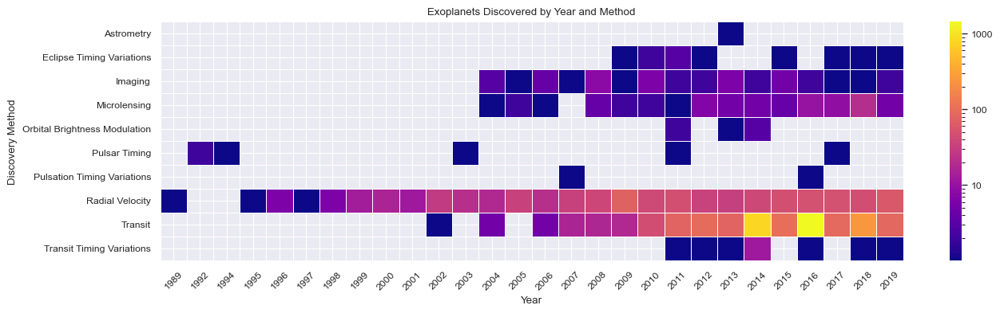

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm
from matplotlib import ticker
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

file_path = 'Datasets/phl_exoplanet_catalog_2019_cleaned.csv'

df = pd.read_csv(file_path)

habitable = df[df['P_HABITABLE'] != 0]
non_habitable = df[df['P_HABITABLE'] == 0]

sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.set_context('paper')
plt.figure(figsize=(15, 3.9))
def format_as_int(x, pos):
    return f'{int(x)}'
sns.heatmap(df.groupby(['P_DETECTION', 'P_YEAR']).size().unstack(), cmap='plasma', linewidths=0.5, fmt='g', norm=LogNorm(), cbar_kws={'ticks': [10, 100, 1000], 'format': ticker.FuncFormatter(format_as_int)})
plt.title('Exoplanets Discovered by Year and Method')
plt.ylabel('Discovery Method')
plt.xlabel('Year')
plt.xticks(rotation=45)
plt.show()

# Potenziale abitabilità degli esopianeti
La maggior parte degli esopianeti finora individuati non mostra caratteristiche compatibili con la vita, il che può dipendere da vari fattori, come masse eccessivamente elevate (con conseguente gravità troppo intensa), bassa densità (indicativa di pianeti gassosi), temperature estreme, sia elevate che basse, e così via. Si nota che il 98.6% dei pianeti è chiaramente non idoneo all'abitabilità, mentre l'1.4% restante potrebbe presentare tali caratteristiche. Di questo 1.4%, il 61.8% potrebbe avere condizioni adatte a sostenere la vita, secondo valutazioni più prudenti, mentre il 38.2% secondo stime più ottimistiche.

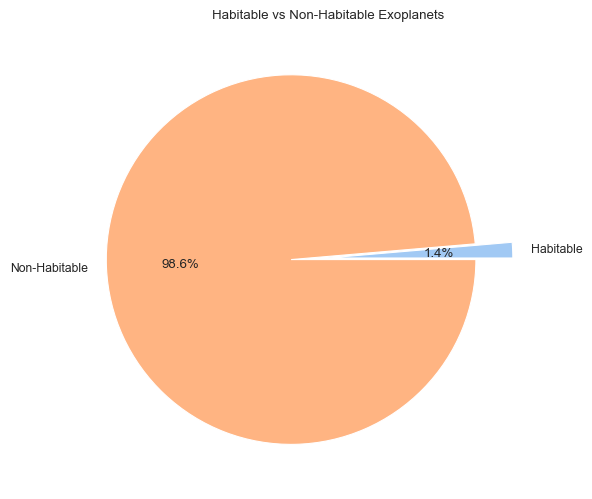

In [48]:
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.set_context('paper')
plt.figure(figsize=(10, 6))
plt.pie([len(habitable), len(non_habitable)], labels=['Habitable', 'Non-Habitable'], autopct='%1.1f%%', colors=sns.color_palette('pastel'), explode=[0, 0.2])
plt.title('Habitable vs Non-Habitable Exoplanets')
plt.show()

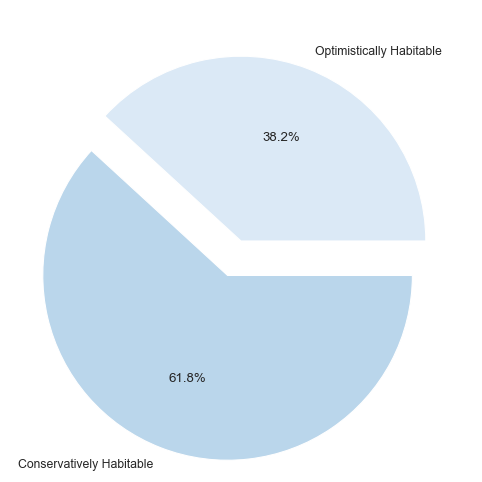

In [49]:
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.set_context('paper')
plt.figure(figsize=(10, 6))
plt.pie([len(habitable[habitable['P_HABITABLE'] == 1]), len(habitable[habitable['P_HABITABLE'] == 2])], labels=['Optimistically Habitable', 'Conservatively Habitable'], autopct='%1.1f%%', colors=sns.color_palette('Blues'), explode=[0, 0.2])
plt.show()

# Interpretazione dell'albero decisionale
Proviamo ora a creare un albero decisionale per definire cosa rende un pianeta abitabile, considerando solo i pianeti ritenuti tali secondo i criteri più rigorosi.

Nell'albero, il parametro che ha il maggiore impatto sulla classificazione dei pianeti è la massa. In particolare, questo criterio ci permette di identificare la maggior parte dei candidati migliori. Continuando nel sottoalbero di sinistra, notiamo che il secondo parametro più rilevante è il flusso stellare (P_FLUX), ossia la quantità di energia che la superficie del pianeta riceve per metro quadro dalla sua stella (misurato in $\frac{W}{m^2}$). Affinché un pianeta sia considerato abitabile, il flusso stellare dovrebbe ideale rientrare tra 0.267 e 1.68 flussi stellari terrestri, cioè la quantità di energia ricevuta dalla superficie terrestre dal Sole.

D'altra parte, considerando il sottoalbero destro, notiamo che il flusso stellare deve comunque rientrare nei parametri menzionati. A questo punto, il parametro determinante diventa il raggio del pianeta, che deve rimanere al di sotto di 1.463 raggi terrestri. Valori superiori a questo indicano una diminuzione della densità del pianeta, suggerendo la presenza di un pianeta gassoso. Successivamente, il parametro finale è la distanza del pianeta dalla stella, che deve essere superiore a 0.083 unità astronomiche (1 ua = distanza media tra la Terra e il Sole): se la distanza è inferiore, il pianeta risulta verosimilmente troppo caldo. Interessante notare come l'albero non imponga un limite superiore alla distanza del pianeta dalla sua stella.

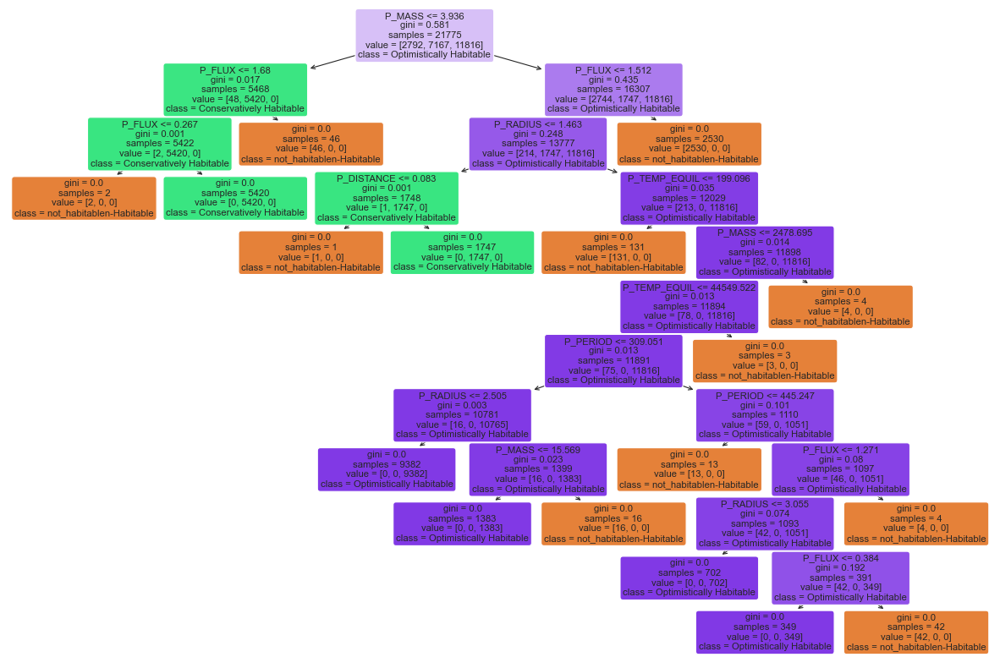

In [50]:
features = ['P_MASS', 'P_RADIUS', 'P_FLUX', 'P_TEMP_EQUIL', 'P_PERIOD', 'P_DISTANCE']
X = oversampled[features]
y = oversampled['P_HABITABLE']

imputer = SimpleImputer(strategy='mean')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=12345)

clf = DecisionTreeClassifier(random_state=12345)

clf.fit(X_train, y_train)

plt.figure(figsize=(15, 10))
plot_tree(clf, feature_names=features, class_names=['not_habitablen-Habitable', 'Conservatively Habitable', 'Optimistically Habitable'], filled=True, rounded=True)
plt.show()

# Viaggi spaziali
Supponiamo ora di disporre di una tecnologia (che, attualmente, consideriamo fantascientifica) in grado di superare le immense distanze che separano la Terra da uno di questi esopianeti. Notiamo che la maggior parte degli esopianeti si trova a una distanza di circa 1000 parsec dal nostro pianeta; considerando che 1 parsec equivale a circa 3.26 anni luce, la distanza più comune risulta essere di circa 3000 anni luce. Tuttavia, supponiamo di voler raggiungere uno dei pianeti più vicini e promettenti, Teegarden's Star B, situato a circa 12 anni luce dal Sole. Se il nostro veicolo spaziale dovesse, per ipotesi, raggiungere il 99% della velocità della luce, potremmo approssimativamente affermare che in 12 anni raggiungerebbe la Stella di Teegarden. Sebbene sia un periodo di tempo considerevole, specialmente considerando un possibile ritorno, sarebbe comunque realizzabile nel corso di una vita umana... o forse no? Oltre alle sfide tecnologiche, si presenta un ostacolo di natura più squisitamente fisica: la relatività ristretta di Einstein, infatti, insegna che il tempo non è assoluto, ma si dilata o si contrae a seconda dell'osservatore.

Consideriamo, in particolare, un osservatore sulla Terra e uno a bordo dell'astronave: il tempo minimo del viaggio, o, in altre parole, il tempo soggettivo (quello dell'astronauta), è di 12 anni, come già discusso, e non può essere ridotto ulteriormente. Tuttavia, il problema sorge per l'osservatore sulla Terra. Il tempo misurato subisce infatti una dilatazione proporzionale alla velocità della navicella, come illustrato nel grafico sottostante. In particolare, indicando con $t$ il tempo soggettivo e con $t'$ il tempo misurato, la dilatazione temporale è data dalla formula:

$$\Delta{t'} = \frac{\Delta{t}}{\sqrt{1 - \frac{v^2}{c^2}}} $$

A una velocità del 99% della velocità della luce, il fattore di dilatazione temporale è di circa 7. Pertanto, i 12 anni di viaggio corrisponderebbero a quasi 84 anni per un osservatore sulla Terra. Considerando anche un eventuale ritorno, ci troveremmo già intorno ai 170 anni, ben al di là delle attuali possibilità della vita umana. Al ritorno, dunque, i nostri ipotetici astronauti troverebbero un mondo profondamente cambiato, con la maggior parte dei loro conoscenti deceduti o estremamente anziani.

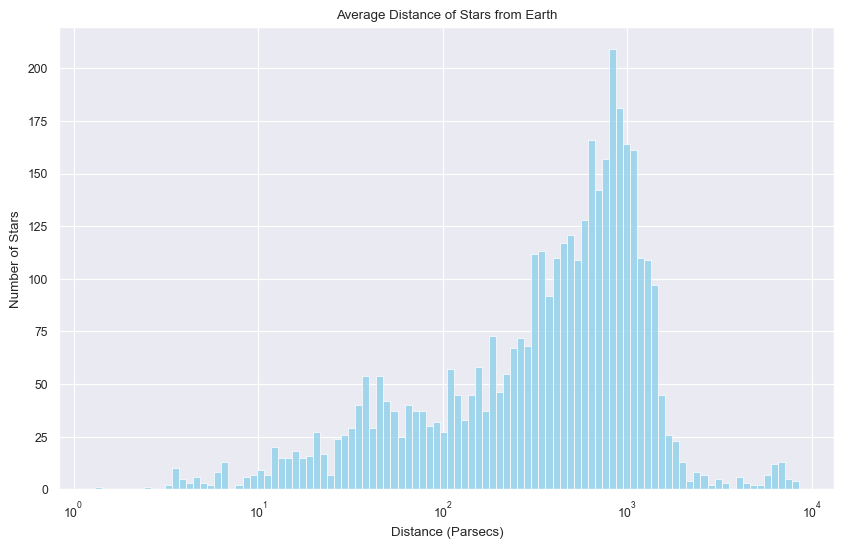

In [51]:
sns.set_style('darkgrid')
sns.set_palette('Set2')
sns.set_context('paper')
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='S_DISTANCE', bins=100, log_scale=True, color='skyblue')
plt.title('Average Distance of Stars from Earth')
plt.xlabel('Distance (Parsecs)')
plt.ylabel('Number of Stars')
plt.show()

In [18]:
C=299792458 #Velocità della luce in m/s
import numpy as np
def time_dilation(v):
    return 1 / np.sqrt(1 - (v**2 / C**2))
print(time_dilation(C*0.99))

7.088812050083374


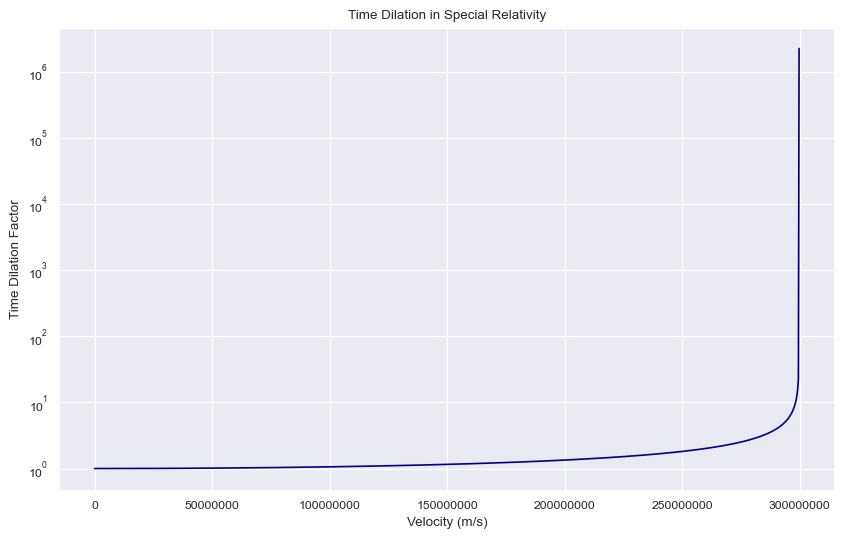

In [16]:
import numpy as np

def time_dilation(v):
    return 1 / np.sqrt(1 - (v**2 / C**2))

v = np.linspace(0, 0.9999999999999 * C, 1000)

plt.figure(figsize=(10, 6))
plt.plot(v, time_dilation(v))
plt.title('Time Dilation in Special Relativity')
plt.xlabel('Velocity (m/s)')
plt.ylabel('Time Dilation Factor')

plt.ticklabel_format(style='plain', axis='x')

plt.gca().get_lines()[0].set_color('darkblue')

plt.yscale('log')
plt.show()


# Distribuzione delle caratteristiche degli esopianeti necessarie alla vita
Procediamo con l'analisi della distribuzione dei parametri utilizzati dall'albero decisionale per cercare di comprendere le "scelte" effettuate da quest'ultimo. Se prendiamo in considerazione solo i pianeti potenzialmente abitabili secondo i criteri più rigorosi (P_HABITABLE = 1), notiamo che i valori "accettabili" per quanto riguarda la massa sono piuttosto limitati, variando al massimo da 1 a circa 10 masse terrestri. Questa limitazione è coerente con quanto evidenziato dall'albero, il quale, in effetti, impone un limite superiore ancora più restrittivo, fissato a 4 masse solari.

Analogamente, il raggio planetario mostra una distribuzione concentrata principalmente attorno a 1 raggio terrestre, così come il flusso stellare, che è anch'esso circoscritto intorno al flusso stellare terrestre ($10^0$), e la temperatura media, che presenta un intervallo ammissibile poco al di sotto dei 300K, analogo a quello terrestre.

D'altra parte, notiamo che la distanza del pianeta dalla stella e il periodo di rivoluzione appaiono come caratteristiche meno rilevanti, con una distribuzione ampia e variegata. Questo è in linea con quanto confermato dall'albero decisionale, che le considera solo nei nodi più bassi, specialmente nel sottoalbero destro, il quale identifica solo i pianeti ottimisticamente abitabili nei casi migliori.

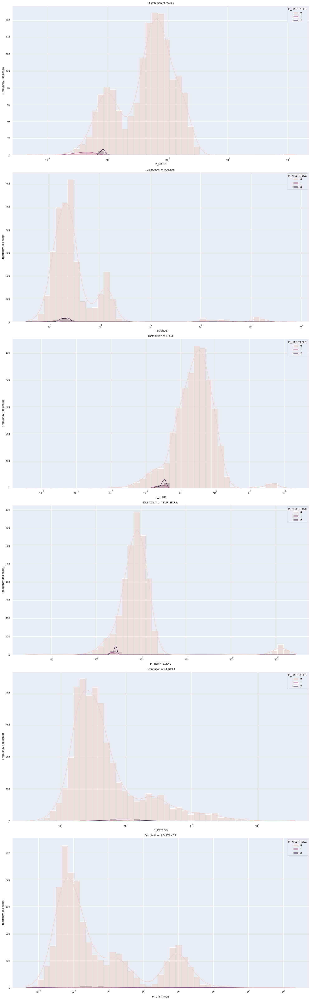

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(15, 8 * len(features)))

for i, feature in enumerate(features):
    sns.histplot(data=df, x=feature, bins=45, kde=True, ax=axes[i], color='skyblue', log_scale=True, hue='P_HABITABLE')
    axes[i].set_title(f'Distribution of {feature.removeprefix("P_")}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency (log scale)')

plt.tight_layout()
plt.show()


# Mappare gli esopianeti
Procediamo ora nella creazione di una mappa per localizzare i pianeti nel cielo notturno. Per semplificare, invece di mappare direttamente i pianeti, focalizziamoci sulle loro stelle, raggruppando eventuali pianeti appartenenti alla stessa stella. Intuitivamente, potremmo aspettarci che, mappando queste stelle, osserveremmo una distribuzione essenzialmente uniforme, come del resto sembra confermare la nostra esperienza: guardando il cielo notturno, indipendentemente dalla direzione in cui guardiamo, osserviamo più o meno sempre la stessa densità stellare. Tuttavia, ciò non si verifica costruendo la mappa: possiamo immediatamente osservare che, in corrispondenza della linea azzurra, ci sono aggregazioni di stelle più dense rispetto al resto della mappa. Questo quindi smentisce la nostra intuizione iniziale, e ci permette di affermare che le stelle non sono affatto distribuite equamente, ma sembrano seguire uno schema ben preciso, che possiamo spiegare semplicemente: quella linea (e la corrispondente variazione nella densità stellare) rappresenta la proiezione della Via Lattea sul cielo notturnoe ha infatti senso aspettarsi di trovare più pianeti all'interno di una galassia piuttosto che al di fuori; la forma sinusoidale è dovuta all'inclinazione della Terra rispetto all'asse della galassia.

La seconda anomalia, più bizzarra della prima, si trova in alto a sinistra nella mappa, approssimativamente alle coordinate (-70° RA, +45° DEC), dove si osserva una forma che vagamente ricorda due rettangoli sovrapposti composti da piccoli quadrati. Ovviamente, a quelle coordinate non c'è nulla di simile osservabile nel cielo notturno. Come possiamo spiegare ciò che vediamo sulla mappa? Potremmo ipotizzare un errore nei dati, ma prima di arrivare a questa conclusione, proviamo a cercare spiegazioni più semplici. Cominciamo con un dato: approssimativamente a quelle coordinate si trovano tre costellazioni: _Lyra_, _Cygnus_ e _Draco_. In quella regione del cielo è stata rivolta, per tutta la sua durata, la missione Kepler e, successivamente, K2 (il telescopio spaziale è rimasto lo stesso, solo il nome della missione è cambiato). Questo potrebbe spiegare la densità anomala di stelle in quella regione, ma non è ancora sufficiente per giustificare il pattern osservato. Tuttavia, osservando una foto del telescopio utilizzato dalla missione Kepler, tutto diventa chiaro: il sensore di Kepler presenta esattamente lo stesso pattern che possiamo notare sulla mappa. Quella che avevamo erroneamente considerato un'anomalia è in realtà una sorta di "ombra" proiettata dal telescopio sulla mappa durante l'osservazione di quelle stelle.

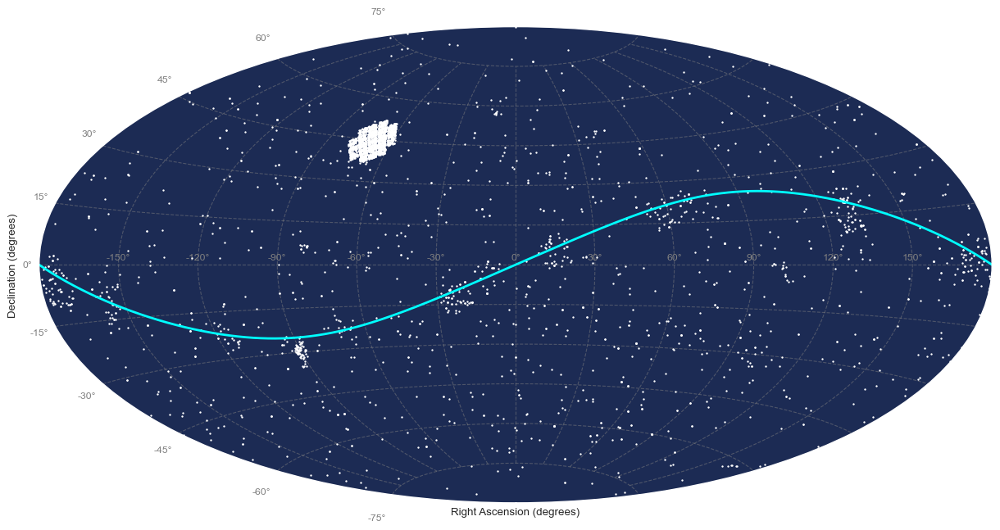

In [21]:
from astropy import units as u
from astropy.coordinates import SkyCoord
import numpy as np
import matplotlib.pyplot as plt

S_RA, S_DEC = df['S_RA'], df['S_DEC']
coords = SkyCoord(ra=np.degrees(np.unwrap(np.radians(S_RA))) % 360*u.degree, dec=np.clip(S_DEC, -90, 90)*u.degree, frame='icrs', unit="degree")

milky_way_sinusoid = lambda ra: -25 * np.sin(np.radians(ra - 180))
milky_way_ra = np.linspace(-180, 180, 1000)
milky_way_dec = milky_way_sinusoid(milky_way_ra)

fig, ax = plt.subplots(subplot_kw={'projection': 'aitoff'}, figsize=(15, 10))
ax.scatter(coords.ra.wrap_at(180*u.deg).radian, coords.dec.radian, s=0.8, color='white')
ax.plot(np.radians(milky_way_ra), np.radians(milky_way_dec), color='cyan', linestyle='-', linewidth=2)

ax.set(xlabel='Right Ascension (degrees)', ylabel='Declination (degrees)', facecolor='#1C2B54')
ax.grid(True, color='gray', linestyle='--', alpha=0.5)
ax.tick_params(axis='both', colors='grey')

plt.show()
